In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
df = pd.read_csv("student-evaluation_generic.csv")


In [3]:
pd.pandas.set_option("display.max_columns",None)
pd.pandas.set_option("display.max_rows",None)

In [4]:
df

,instr,class,nb.repeat,attendance,difficulty,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q18,Q19,Q20,Q21,Q22,Q23,Q24,Q25,Q26,Q27,Q28
0,1,2,1,0,4,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
1,1,2,1,1,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
2,1,2,1,2,4,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5
3,1,2,1,1,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
4,1,2,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5,1,2,1,3,3,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
6,1,2,1,1,3,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
7,1,2,1,1,3,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5
8,1,2,1,1,3,4,4,4,4,4,4,4,4,4,4,5,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
9,1,2,1,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4


In [19]:
print(df['attendance'].unique())
print(df['difficulty'].unique())

[0 1 2 3 4]
[4 3 1 2 5]


In [5]:
df.shape

(5820, 33)

In [60]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
data_pca = pca.fit_transform(df)

In [61]:
from sklearn.preprocessing import MinMaxScaler

sc = MinMaxScaler()

In [62]:
scaled_data = sc.fit_transform(data_pca)

In [63]:
scaled_data

array([[0.49439003, 0.89160809],
       [0.49306467, 0.89057066],
       [0.00531513, 0.86422897],
       ...,
       [0.02769885, 0.00679374],
       [0.99655746, 0.06039683],
       [0.99655746, 0.06039683]])

In [64]:
scaled_data.shape

(5820, 2)

In [65]:
from sklearn.cluster import KMeans


In [66]:
k_range = range(1,26)

sse = []   #sum_squared_error

for i in k_range:
    km = KMeans(n_clusters=i)
    km.fit(scaled_data)
    sse.append(km.inertia_)       #km.inertia_ gives the sum of squared distances of samples to their closest clusters center

In [22]:
sse

[19789.118785796105,
 10926.708935328012,
 7744.531040493233,
 6889.248976251743,
 6364.777953778871,
 6073.80266263705,
 5862.050295649932,
 5684.041317480953,
 5555.533150022238,
 5416.967383011508,
 5276.927419448268,
 5165.665389228262,
 5076.933989589552,
 4947.950636199795,
 4863.24013665867,
 4785.406988329813,
 4724.9475415317775,
 4709.51874127057,
 4618.795207623167,
 4563.81843693278,
 4529.862551806535,
 4497.551332952926,
 4444.9193837414505,
 4413.865775398674,
 4354.630899778689]

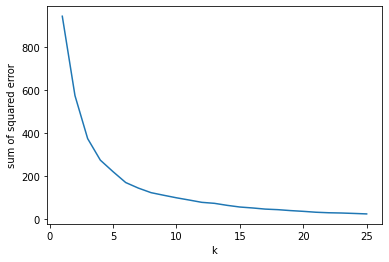

In [67]:
plt.xlabel('k')
plt.ylabel('sum of squared error')
plt.plot(k_range,sse)


In [25]:
# k = 5

In [68]:
model = KMeans(n_clusters=5)

In [69]:
y_predicted = model.fit_predict(scaled_data)

In [70]:
y_predicted

array([3, 3, 0, ..., 2, 1, 1])

In [71]:
len(y_predicted)

5820

In [72]:
df['cluster'] = y_predicted

In [73]:
df

,instr,class,nb.repeat,attendance,difficulty,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q18,Q19,Q20,Q21,Q22,Q23,Q24,Q25,Q26,Q27,Q28,cluster
0,1,2,1,0,4,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
1,1,2,1,1,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
2,1,2,1,2,4,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,0
3,1,2,1,1,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
4,1,2,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,3
5,1,2,1,3,3,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,0
6,1,2,1,1,3,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,0
7,1,2,1,1,3,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,0
8,1,2,1,1,3,4,4,4,4,4,4,4,4,4,4,5,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,0
9,1,2,1,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,0


In [74]:
df['cluster'].unique()

array([3, 0, 4, 1, 2], dtype=int64)

In [75]:
len(df['cluster'].unique())

5

In [76]:
sorted(df['cluster'].unique())

[0, 1, 2, 3, 4]

In [78]:
df1 = df[df.cluster==0]
df2 = df[df.cluster==1]
df3 = df[df.cluster==2]
df4 = df[df.cluster==3]
df5 = df[df.cluster==4]


No handles with labels found to put in legend.


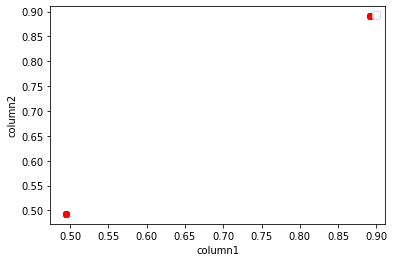

In [83]:
plt.scatter(scaled_data[0], scaled_data[1], color='green')
plt.scatter(scaled_data[0], scaled_data[1], color='blue')
plt.scatter(scaled_data[0], scaled_data[1], color='yellow')
plt.scatter(scaled_data[0], scaled_data[1], color='blue')
plt.scatter(scaled_data[0], scaled_data[1], color='red')

plt.xlabel('column1')
plt.ylabel('column2')
plt.legend()